In [16]:
import numpy as np
import pandas as pd 
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import pickle
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.sandbox.regression.predstd import wls_prediction_std
import datetime
import xlrd
import os
import re
from scipy.stats import kstest
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader
from scipy import optimize
import pwlf
from scipy.optimize import minimize
from pyecharts import options as opts
from pyecharts.charts import Calendar
from matplotlib.ticker import FuncFormatter
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import math
from sklearn.exceptions import ConvergenceWarning
import warnings
import xgboost as xgb
import contextlib

In [2]:
# load day ahead price data from E:\day-ahead price\Data\ISO_New_England\day_ahead_price
path = r'E:\day-ahead price\Data\ISO_New_England\day_ahead_price'
os.chdir(path)
files = os.listdir(path)
df = pd.DataFrame()
for file in files:
    delimiter = ','
    max_columns = max(open(file), key=lambda x: x.count(delimiter)).count(delimiter)
    df_tmp = pd.read_csv(file, header=None, names=list(range(max_columns+1)))
    # print(df_tmp)
    df = pd.concat([df, df_tmp])
df.columns = df.iloc[4]
df = df[df['H'] == 'D'].drop(['H'], axis = 1).reset_index(drop = True)
# average price by Date and Hour Ending
tmp = []
df['Hour Ending'] = df['Hour Ending'].astype(str)
df['Date'] = pd.to_datetime(df['Date'])
df['Date'] = df['Date'].dt.strftime('%Y-%m-%d')
df['Locational Marginal Price'] = df['Locational Marginal Price'].astype(float)
df['Energy Component'] = df['Energy Component'].astype(float)
df['Congestion Component'] = df['Congestion Component'].astype(float)
df['Marginal Loss Component'] = df['Marginal Loss Component'].astype(float)
df_group = df.groupby(['Date', 'Hour Ending'])
for [Date, Hour_Ending], group in df_group:
    Locational_Marginal_Price = group['Locational Marginal Price'].mean() 
    Energy_Component = group['Energy Component'].mean()
    Congestion_Component = group['Congestion Component'].mean()
    Marginal_Loss_Component = group['Marginal Loss Component'].mean()
    tmp.append([Date, Hour_Ending, Locational_Marginal_Price, Energy_Component, Congestion_Component, Marginal_Loss_Component])
df_price = pd.DataFrame(tmp, columns = ['Date', 'Hour Ending', 'Locational Marginal Price', 'Energy Component', 'Congestion Component', 'Marginal Loss Component'])
df_price

,Date,Hour Ending,Locational Marginal Price,Energy Component,Congestion Component,Marginal Loss Component
0,2022-01-01,01,32.124229,32.35,-0.089337,-0.136434
1,2022-01-01,02,32.057678,32.31,-0.111808,-0.140514
2,2022-01-01,03,30.726426,30.85,0.000000,-0.123574
3,2022-01-01,04,29.569668,29.69,0.000000,-0.120332
4,2022-01-01,05,30.738126,30.86,0.000000,-0.121874
...,...,...,...,...,...,...
16315,2023-11-11,20,40.609046,40.90,-0.030929,-0.260025
16316,2023-11-11,21,40.179589,40.43,-0.028840,-0.221571
16317,2023-11-11,22,39.871406,40.09,-0.032385,-0.186209
16318,2023-11-11,23,29.190831,29.34,-0.002179,-0.146990


In [3]:
# df_price lack a line of data in Date 2023-03-12, Hour Ending 3, so we need to add this line by average of Hour Ending 2 and Hour Ending 4
lost_data = pd.DataFrame({'Date': '2023-03-12', 'Hour Ending': '03', 'Locational Marginal Price': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Locational Marginal Price'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Locational Marginal Price'].values[0])/2, 'Energy Component': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Energy Component'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Energy Component'].values[0])/2, 'Congestion Component': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Congestion Component'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Congestion Component'].values[0])/2, 'Marginal Loss Component': (df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '02')]['Marginal Loss Component'].values[0] + df_price[(df_price['Date'] == '2023-03-12') & (df_price['Hour Ending'] == '04')]['Marginal Loss Component'].values[0])/2}, index = [0])
df_price = pd.concat([df_price, lost_data]).sort_values(by = ['Date', 'Hour Ending']).reset_index(drop = True)
# delete the line of data in Date 2023-11-05, whose Hour Ending = '02X' 
df_price = df_price.drop(df_price[(df_price['Date'] == '2023-11-05') & (df_price['Hour Ending'] == '02X')].index).reset_index(drop = True)
# delete the line of data in Date 2022-11-06, whose Hour Ending = '02X' 
df_price = df_price.drop(df_price[(df_price['Date'] == '2022-11-06') & (df_price['Hour Ending'] == '02X')].index).reset_index(drop = True)
df_price['Hour Ending'] = df_price['Hour Ending'].astype(int)
df_price['Date'] = pd.to_datetime(df_price['Date'])
df_price

,Date,Hour Ending,Locational Marginal Price,Energy Component,Congestion Component,Marginal Loss Component
0,2022-01-01,1,32.124229,32.35,-0.089337,-0.136434
1,2022-01-01,2,32.057678,32.31,-0.111808,-0.140514
2,2022-01-01,3,30.726426,30.85,0.000000,-0.123574
3,2022-01-01,4,29.569668,29.69,0.000000,-0.120332
4,2022-01-01,5,30.738126,30.86,0.000000,-0.121874
...,...,...,...,...,...,...
16314,2023-11-11,20,40.609046,40.90,-0.030929,-0.260025
16315,2023-11-11,21,40.179589,40.43,-0.028840,-0.221571
16316,2023-11-11,22,39.871406,40.09,-0.032385,-0.186209
16317,2023-11-11,23,29.190831,29.34,-0.002179,-0.146990


In [4]:
# load real capacity data from E:\day-ahead price\Data\ISO_New_England\real_capacity
path = r'E:\day-ahead price\Data\ISO_New_England\real_capacity'
os.chdir(path)
files = os.listdir(path)
df_peak_load = pd.DataFrame()
df_capa = pd.DataFrame()
df_interchange = pd.DataFrame()
for file in files:
    delimiter = ','
    max_columns = max(open(file), key=lambda x: x.count(delimiter)).count(delimiter)
    df_tmp = pd.read_csv(file, header=None, names=list(range(max_columns+1)))
    df_tmp = df_tmp.iloc[8:50, :].reset_index(drop=True)

    prior_date = pd.to_datetime(df_tmp.iloc[1, 1])
    Hour_Ending = int(df_tmp.iloc[1, 2])
    peak_load = float(df_tmp.iloc[1, 3])
    df_peak_load = pd.concat([df_peak_load, pd.DataFrame([[prior_date, Hour_Ending, peak_load]], columns=['Date', 'Hour Ending', 'Peak Load'])], axis=0)

    report_date = prior_date + datetime.timedelta(1)
    Capacity_Supply_Obligation = float(df_tmp.iloc[4, 2])
    Capacity_Additions_EcoMax_Bid_CSO = float(df_tmp.iloc[5, 2])	
    Generation_Outages_and_Reductions = float(df_tmp.iloc[6, 2])
    Uncommitted_Available_Generation = float(df_tmp.iloc[7, 2])
    DRR_Capacity = float(df_tmp.iloc[8, 2])
    Uncommitted_Available_DRR = float(df_tmp.iloc[9, 2])
    Net_Deliveries = float(df_tmp.iloc[17, 2])
    Total_Available_Capacity = float(df_tmp.iloc[18, 2])
    Peak_Load_Forecast = float(df_tmp.iloc[19, 2])
    Total_Operating_Reserve_Requirements = float(df_tmp.iloc[20, 2])
    Capacity_Required = float(df_tmp.iloc[21, 2])
    Surplus_Deficiency = float(df_tmp.iloc[22, 2])
    Replacement_Reserve_Requirement = float(df_tmp.iloc[23, 2])
    Excess_Commitment_Surplus_Deficiency = float(df_tmp.iloc[24, 2])
    df_capa = pd.concat([df_capa, pd.DataFrame([[report_date, Hour_Ending, Capacity_Supply_Obligation, Capacity_Additions_EcoMax_Bid_CSO, Generation_Outages_and_Reductions, Uncommitted_Available_Generation, DRR_Capacity, Uncommitted_Available_DRR, Net_Deliveries, Total_Available_Capacity, Peak_Load_Forecast, Total_Operating_Reserve_Requirements, Capacity_Required, Surplus_Deficiency, Replacement_Reserve_Requirement, Excess_Commitment_Surplus_Deficiency]], columns=['Date', 'Hour Ending', 'Capacity Supply Obligation', 'Capacity Additions EcoMax Bid CSO', 'Generation Outages and Reductions', 'Uncommitted Available Generation', 'DRR Capacity', 'Uncommitted Available DRR', 'Net Deliveries', 'Total Available Capacity', 'Peak Load Forecast', 'Total Operating Reserve Requirements', 'Capacity Required', 'Surplus Deficiency', 'Replacement Reserve Requirement', 'Excess Commitment Surplus Deficiency'])], axis=0)

    tmp_interchange = df_tmp.iloc[35:, 1:].reset_index(drop=True)
    tmp_interchange.columns = tmp_interchange.iloc[0]
    tmp_interchange = tmp_interchange.iloc[1:, :].reset_index(drop=True)
    tmp_interchange['Date'] = report_date
    df_interchange = pd.concat([df_interchange, tmp_interchange], axis=0)
    
df_peak_load = df_peak_load.drop_duplicates(subset=['Date'], keep='first').reset_index(drop=True)
df_capa = df_capa.drop_duplicates(subset=['Date'], keep='first').reset_index(drop=True)
df_interchange = df_interchange.drop_duplicates(subset=['Date', 'Description'], keep='first').reset_index(drop=True)
df_capa

,Date,Hour Ending,Capacity Supply Obligation,Capacity Additions EcoMax Bid CSO,Generation Outages and Reductions,Uncommitted Available Generation,DRR Capacity,Uncommitted Available DRR,Net Deliveries,Total Available Capacity,Peak Load Forecast,Total Operating Reserve Requirements,Capacity Required,Surplus Deficiency,Replacement Reserve Requirement,Excess Commitment Surplus Deficiency
0,2022-01-01,18,29741.0,1491.0,2621.0,13055.0,233.0,12.0,-3394.0,19171.0,14220.0,2209.0,16429.0,2742.0,180.0,2562.0
1,2022-01-02,18,29741.0,1970.0,1930.0,13834.0,232.0,12.0,-3088.0,19255.0,15400.0,2209.0,17609.0,1646.0,180.0,1466.0
2,2022-01-03,18,29741.0,2124.0,1806.0,11739.0,331.0,12.0,-2794.0,21433.0,18000.0,2209.0,20209.0,1224.0,180.0,1044.0
3,2022-01-04,18,29741.0,1867.0,2509.0,11443.0,322.0,12.0,-3146.0,21112.0,17570.0,2209.0,19779.0,1333.0,180.0,1153.0
4,2022-01-05,18,29741.0,1817.0,2524.0,9464.0,325.0,12.0,-1837.0,21720.0,16700.0,2209.0,18909.0,2811.0,180.0,2631.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
675,2023-11-07,18,28377.0,1129.0,9637.0,4125.0,220.0,12.0,-2401.0,18353.0,14500.0,2108.0,16608.0,1745.0,180.0,1565.0
676,2023-11-08,18,28377.0,1769.0,8918.0,4023.0,220.0,12.0,-2383.0,19796.0,15280.0,2053.0,17333.0,2463.0,180.0,2283.0
677,2023-11-09,18,28377.0,974.0,9639.0,3207.0,226.0,12.0,-2002.0,18721.0,15360.0,2110.0,17470.0,1251.0,180.0,1071.0
678,2023-11-10,18,28377.0,1268.0,9118.0,4559.0,224.0,12.0,-2145.0,18325.0,14830.0,2068.0,16898.0,1427.0,180.0,1247.0


In [5]:
# load real load data from E:\day-ahead price\Data\ISO_New_England\real_load
path = r'E:\day-ahead price\Data\ISO_New_England\real_load'
os.chdir(path)
files = os.listdir(path)
df_real_load = pd.DataFrame()
for file in files:
    delimiter = ','
    max_columns = max(open(file), key=lambda x: x.count(delimiter)).count(delimiter)
    df_tmp = pd.read_csv(file, header=None, names=list(range(max_columns+1)))
    df_tmp.columns = df_tmp.iloc[4]
    df_tmp = df_tmp[df_tmp['H'] == 'D'].iloc[:, 1:].reset_index(drop=True)
    df_tmp['Date'] = pd.to_datetime(df_tmp['Date'])
    df_tmp = df_tmp[df_tmp['Hour Ending'] != '02X']
    df_tmp['Hour Ending'] = df_tmp['Hour Ending'].astype(int)
    df_tmp['Day-Ahead Cleared Demand'] = df_tmp['Day-Ahead Cleared Demand'].astype(float)
    df_real_load = pd.concat([df_real_load, df_tmp], axis=0)
df_real_load

4,Date,Hour Ending,Day-Ahead Cleared Demand
0,2022-10-01,1,9518.0
1,2022-10-01,2,9639.0
2,2022-10-01,3,9445.0
3,2022-10-01,4,9317.0
4,2022-10-01,5,9460.0
...,...,...,...
356,2023-11-11,20,13427.0
357,2023-11-11,21,13145.0
358,2023-11-11,22,12383.0
359,2023-11-11,23,11749.0


In [6]:
# df_real_load lack a line of data in Date 2023-03-12, Hour Ending 3, so we need to add this line by average of Hour Ending 2 and Hour Ending 4
df_tmp = df_real_load[(df_real_load['Date'] == '2023-03-12') & (df_real_load['Hour Ending'] == 2)].reset_index(drop=True)
df_tmp['Hour Ending'] = 3
df_tmp['Day-Ahead Cleared Demand'] = (df_real_load[(df_real_load['Date'] == '2023-03-12') & (df_real_load['Hour Ending'] == 2)]['Day-Ahead Cleared Demand'].values + df_real_load[(df_real_load['Date'] == '2023-03-12') & (df_real_load['Hour Ending'] == 4)]['Day-Ahead Cleared Demand'].values) / 2
df_real_load = pd.concat([df_real_load, df_tmp], axis=0).reset_index(drop=True).sort_values(by=['Date', 'Hour Ending']).reset_index(drop=True)
df_real_load

4,Date,Hour Ending,Day-Ahead Cleared Demand
0,2022-10-01,1,9518.0
1,2022-10-01,2,9639.0
2,2022-10-01,3,9445.0
3,2022-10-01,4,9317.0
4,2022-10-01,5,9460.0
...,...,...,...
9763,2023-11-11,20,13427.0
9764,2023-11-11,21,13145.0
9765,2023-11-11,22,12383.0
9766,2023-11-11,23,11749.0


In [7]:
# load real wind generation data from E:\day-ahead price\Data\ISO_New_England\real_wind
path = r'E:\day-ahead price\Data\ISO_New_England\real_wind'
os.chdir(path)
df_wind_generation1 = pd.read_excel('hourly_wind_gen_2023.xlsx', sheet_name='HourlyData')
df_wind_generation2 = pd.read_excel('hourly_wind_gen_2022.xlsx', sheet_name='HourlyData')
df_wind_generation = pd.concat([df_wind_generation2, df_wind_generation1], axis=0).reset_index(drop=True)
# delete the line of data in Date 2022-11-06, whose local_hour_end = '02X' 
df_wind_generation = df_wind_generation.drop(df_wind_generation[(df_wind_generation['local_day'] == '2022-11-06') & (df_wind_generation['local_hour_end'] == '02X')].index).reset_index(drop = True)
# df lack a line of data in Date 2023-03-12, Hour Ending 2, so we need to add this line by average of Hour Ending 1 and Hour Ending 3
lost_data = pd.DataFrame({'year': 2023, 'local_day': pd.to_datetime('2023-03-12'), 'local_hour_end': 2, 'tot_wind_mwh': (df_wind_generation[(df_wind_generation['local_day'] == '2023-03-12') & (df_wind_generation['local_hour_end'] == 1)]['tot_wind_mwh'].values[0] + df_wind_generation[(df_wind_generation['local_day'] == '2023-03-12') & (df_wind_generation['local_hour_end'] == 3)]['tot_wind_mwh'].values[0])/2}, index = [0])
df_wind_generation = pd.concat([df_wind_generation, lost_data]).sort_values(by = ['local_day', 'local_hour_end']).reset_index(drop = True)
df_wind_generation['Hour Ending'] = df_wind_generation['local_hour_end'].astype(int)
df_wind_generation['Date'] = pd.to_datetime(df_wind_generation['local_day'])
df_wind_generation

,year,local_day,local_hour_end,tot_wind_mwh,_FREQ_,Hour Ending,Date
0,2022,2022-01-01,01,87.365,45.0,1,2022-01-01
1,2022,2022-01-01,02,108.647,44.0,2,2022-01-01
2,2022,2022-01-01,03,131.752,46.0,3,2022-01-01
3,2022,2022-01-01,04,154.410,46.0,4,2022-01-01
4,2022,2022-01-01,05,154.527,43.0,5,2022-01-01
...,...,...,...,...,...,...,...
15306,2023,2023-09-30,20,77.428,41.0,20,2023-09-30
15307,2023,2023-09-30,21,97.503,41.0,21,2023-09-30
15308,2023,2023-09-30,22,97.517,41.0,22,2023-09-30
15309,2023,2023-09-30,23,95.512,44.0,23,2023-09-30


In [8]:
# load forecast capacity data from E:\day-ahead price\Data\ISO_New_England\forecast_capacity
path = r'E:\day-ahead price\Data\ISO_New_England\forecast_capacity'
os.chdir(path)
files = os.listdir(path)
df1 = pd.DataFrame()
df2 = pd.DataFrame()
for file in files:
    delimiter = ','
    max_columns = max(open(file), key=lambda x: x.count(delimiter)).count(delimiter)
    df_tmp = pd.read_csv(file, header=None, names=list(range(max_columns+1)))
    df_tmp = df_tmp.iloc[6:27, 1:4].T
    df_tmp.columns = df_tmp.iloc[0]
    df_tmp = df_tmp.drop(['Weather', 'High Temperature - Boston', 'Dew Point - Boston', 'High Temperature - Hartford', 'Dew Point - Hartford', 'Generating Capacity Position'], axis=1).reset_index(drop=True).iloc[1:,:]
    df_tmp['Date'] = pd.to_datetime(df_tmp['Date'])
    df_tmp['Total Capacity Supply Obligation (CSO)'] = df_tmp['Total Capacity Supply Obligation (CSO)'].astype(float)
    df_tmp['Anticipated Cold Weather Outages'] = df_tmp['Anticipated Cold Weather Outages'].astype(float)
    df_tmp['Other Generation Outages'] = df_tmp['Other Generation Outages'].astype(float)
    df_tmp['Anticipated De-List MW Offered'] = df_tmp['Anticipated De-List MW Offered'].astype(float)
    df_tmp['Total Generation Available'] = df_tmp['Total Generation Available'].astype(float)
    df_tmp['Import at Time of Peak'] = df_tmp['Import at Time of Peak'].astype(float)
    df_tmp['Total Available Generation and Imports'] = df_tmp['Total Available Generation and Imports'].astype(float)
    df_tmp['Projected Peak Load'] = df_tmp['Projected Peak Load'].astype(float)
    df_tmp['Replacement Reserve Requirement'] = df_tmp['Replacement Reserve Requirement'].astype(float)
    df_tmp['Required Reserve'] = df_tmp['Required Reserve'].astype(float)
    df_tmp['Required Reserve including Replacement'] = df_tmp['Required Reserve including Replacement'].astype(float)
    df_tmp['Total Load plus Required Reserve'] = df_tmp['Total Load plus Required Reserve'].astype(float)
    df_tmp['Projected Surplus/(Deficiency)'] = df_tmp['Projected Surplus/(Deficiency)'].astype(float)
    df_tmp['Available Demand Response Resources'] = df_tmp['Available Demand Response Resources'].astype(float)
    column_name = df_tmp.columns
    df1 = pd.concat([df1, df_tmp.iloc[0, :]], axis=1)
    df2 = pd.concat([df2, df_tmp.iloc[1, :]], axis=1)
df1 = df1.T
df2 = df2.T
df1.columns = column_name
df2.columns = column_name
df1.drop_duplicates(subset=['Date'], keep='first', inplace=True)
df2.drop_duplicates(subset=['Date'], keep='first', inplace=True)
df_capa_pred_D1 = df1.reset_index(drop=True)
df_capa_pred_D2 = df2.reset_index(drop=True)
df_capa_pred_D1

1,Date,Total Capacity Supply Obligation (CSO),Anticipated Cold Weather Outages,Other Generation Outages,Anticipated De-List MW Offered,Total Generation Available,Import at Time of Peak,Total Available Generation and Imports,Projected Peak Load,Replacement Reserve Requirement,Required Reserve,Required Reserve including Replacement,Total Load plus Required Reserve,Projected Surplus/(Deficiency),Available Demand Response Resources
0,2022-10-01,28072.0,0.0,9388.0,1683.0,20367.0,3195.0,23562.0,13250.0,160.0,2303.0,2463.0,15713.0,7849.0,378.0
1,2022-10-02,28072.0,0.0,8530.0,1347.0,20889.0,3195.0,24084.0,13500.0,160.0,2303.0,2463.0,15963.0,8121.0,295.0
2,2022-10-03,28072.0,0.0,8672.0,1541.0,20941.0,3425.0,24366.0,14020.0,160.0,2303.0,2463.0,16483.0,7883.0,273.0
3,2022-10-04,28072.0,0.0,8673.0,1367.0,20766.0,3425.0,24191.0,14500.0,160.0,2303.0,2463.0,16963.0,7228.0,378.0
4,2022-10-05,28072.0,0.0,7819.0,1458.0,21711.0,3525.0,25236.0,14420.0,160.0,2303.0,2463.0,16883.0,8353.0,382.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
400,2023-11-08,28377.0,0.0,10394.0,1243.0,19226.0,3295.0,22521.0,15280.0,180.0,2303.0,2483.0,17763.0,4758.0,342.0
401,2023-11-09,28377.0,0.0,10998.0,1731.0,19110.0,3295.0,22405.0,15360.0,180.0,2303.0,2483.0,17843.0,4562.0,343.0
402,2023-11-10,28377.0,0.0,11241.0,962.0,18098.0,3295.0,21393.0,14830.0,180.0,2303.0,2483.0,17313.0,4080.0,355.0
403,2023-11-11,28377.0,0.0,9945.0,1209.0,19641.0,3095.0,22736.0,14430.0,180.0,2303.0,2483.0,16913.0,5823.0,353.0


In [9]:
# load forecast load data from E:\day-ahead price\Data\ISO_New_England\forecast_load
path = r'E:\day-ahead price\Data\ISO_New_England\forecast_load'
os.chdir(path)
files = os.listdir(path)
tmp1 = []
tmp2 = []
for file in files:
    delimiter = ','
    max_columns = max(open(file), key=lambda x: x.count(delimiter)).count(delimiter)
    df_tmp = pd.read_csv(file, header=None, names=list(range(max_columns+1)))
    # print(df_tmp)
    df_tmp.columns = df_tmp.iloc[4]
    df_tmp = df_tmp.iloc[6:]
    df_tmp = df_tmp[df_tmp['H'] == 'D'].drop(['H'], axis=1).reset_index(drop=True)
    df_tmp['Published Date'] = pd.to_datetime(df_tmp['Published Date'])
    df_tmp['Forecast Date'] = pd.to_datetime(df_tmp['Forecast Date'])
    df_tmp['Published Day'] = df_tmp['Published Date'].dt.strftime('%Y-%m-%d')
    df_tmp['Published Day'] = pd.to_datetime(df_tmp['Published Day'])
    df_tmp['delta'] = df_tmp['Forecast Date'] - df_tmp['Published Day']
    df_tmp['MW'] = df_tmp['MW'].astype(float)
    df_tmp['%'] = df_tmp['%'].astype(float)
    df_tmp1 = df_tmp[df_tmp['delta'] == datetime.timedelta(1)].reset_index(drop=True)
    df_tmp2 = df_tmp[df_tmp['delta'] == datetime.timedelta(2)].reset_index(drop=True)
    df_tmp1.drop_duplicates(subset=['Forecast Date', 'Hour', 'Reliability Region'], keep='first', inplace=True)
    df_tmp2.drop_duplicates(subset=['Forecast Date', 'Hour', 'Reliability Region'], keep='first', inplace=True)
    df_group1 = df_tmp1.groupby(['Forecast Date', 'Hour'])
    
    for [Forecast_Date, Hour], group in df_group1:
        Load = group['MW'].sum()
        percent = group['%'].sum()
        if percent > 90:
            tmp1.append([Forecast_Date, Hour, Load])
    df_group2 = df_tmp2.groupby(['Forecast Date', 'Hour'])
    for [Forecast_Date, Hour], group in df_group2:
        Load = group['MW'].sum()
        percent = group['%'].sum()
        if percent > 90:
            tmp2.append([Forecast_Date, Hour, Load])
df_load_pred_D1 = pd.DataFrame(tmp1, columns=['Forecast Date', 'Hour', 'Load(MW)'])
df_load_pred_D2 = pd.DataFrame(tmp2, columns=['Forecast Date', 'Hour', 'Load(MW)'])
df_load_pred_D1['Date'] = df_load_pred_D1['Forecast Date']
df_load_pred_D2['Date'] = df_load_pred_D2['Forecast Date']
df_load_pred_D1 = df_load_pred_D1[df_load_pred_D1['Hour'] != '02X']
df_load_pred_D2 = df_load_pred_D2[df_load_pred_D2['Hour'] != '02X']
df_load_pred_D1['Hour Ending'] = df_load_pred_D1['Hour'].astype(int)
df_load_pred_D2['Hour Ending'] = df_load_pred_D2['Hour'].astype(int)
df_load_pred_D1

,Forecast Date,Hour,Load(MW),Date,Hour Ending
0,2022-10-01,01,9850.000,2022-10-01,1
1,2022-10-01,02,9410.001,2022-10-01,2
2,2022-10-01,03,9190.000,2022-10-01,3
3,2022-10-01,04,9110.000,2022-10-01,4
4,2022-10-01,05,9140.001,2022-10-01,5
...,...,...,...,...,...
9764,2023-11-11,20,13819.999,2023-11-11,20
9765,2023-11-11,21,13249.999,2023-11-11,21
9766,2023-11-11,22,12730.000,2023-11-11,22
9767,2023-11-11,23,12020.000,2023-11-11,23


In [10]:
# df_load_pred_D1 lack a line of data in Date 2023-03-12, Hour Ending 3, so we need to add this line by average of Hour Ending 2 and Hour Ending 4
df_tmp = df_load_pred_D1[(df_load_pred_D1['Date'] == '2023-03-12') & (df_load_pred_D1['Hour'] == '02')].reset_index(drop=True)
df_tmp['Hour'] = 3
df_tmp['Load(MW)'] = (df_load_pred_D1[(df_load_pred_D1['Date'] == '2023-03-12') & (df_load_pred_D1['Hour'] == '02')]['Load(MW)'].values + df_load_pred_D1[(df_load_pred_D1['Date'] == '2023-03-12') & (df_load_pred_D1['Hour'] == '04')]['Load(MW)'].values) / 2
df_load_pred_D1 = pd.concat([df_load_pred_D1, df_tmp], axis=0).reset_index(drop=True).sort_values(by=['Date', 'Hour']).reset_index(drop=True)
df_load_pred_D1

,Forecast Date,Hour,Load(MW),Date,Hour Ending
0,2022-10-01,01,9850.000,2022-10-01,1
1,2022-10-01,02,9410.001,2022-10-01,2
2,2022-10-01,03,9190.000,2022-10-01,3
3,2022-10-01,04,9110.000,2022-10-01,4
4,2022-10-01,05,9140.001,2022-10-01,5
...,...,...,...,...,...
9763,2023-11-11,20,13819.999,2023-11-11,20
9764,2023-11-11,21,13249.999,2023-11-11,21
9765,2023-11-11,22,12730.000,2023-11-11,22
9766,2023-11-11,23,12020.000,2023-11-11,23


In [11]:
# load forecast wind data from E:\day-ahead price\Data\ISO_New_England\forecast_wind
path = r'E:\day-ahead price\Data\ISO_New_England\forecast_wind'
os.chdir(path)
files = os.listdir(path)
df1 = pd.DataFrame()
df2 = pd.DataFrame()
for file in files:
    delimiter = ','
    max_columns = max(open(file), key=lambda x: x.count(delimiter)).count(delimiter)
    df_tmp = pd.read_csv(file, header=None, names=list(range(max_columns+1)))
    df_tmp = df_tmp.iloc[6:31, 2:6].T.reset_index(drop=True)
    df_tmp.columns = df_tmp.iloc[0]
    df1 = pd.concat([df1, df_tmp.iloc[2, :]], axis=1)
    df2 = pd.concat([df2, df_tmp.iloc[3, :]], axis=1)     
df1 = df1.T
df2 = df2.T
df_wind_pred_D1 = df1.drop(['02X'], axis=1)
df_wind_pred_D2 = df2.drop(['02X'], axis=1)
df_tmp = pd.DataFrame()
for line_index in range(0, len(df_wind_pred_D1)):
    line = df_wind_pred_D1.iloc[line_index, :]
    date = df_wind_pred_D1.iloc[line_index, 0]
    line = pd.DataFrame(line).reset_index()
    line.columns = ['Hour Ending', 'Wind(MW)']
    line['Date'] = date
    line = line.iloc[1:, :]
    df_tmp = pd.concat([df_tmp, line], axis=0)
df_wind_pred_D1 = df_tmp.reset_index(drop=True)
df_tmp = pd.DataFrame()
for line_index in range(0, len(df_wind_pred_D2)):
    line = df_wind_pred_D2.iloc[line_index, :]
    date = df_wind_pred_D2.iloc[line_index, 0]
    line = pd.DataFrame(line).reset_index()
    line.columns = ['Hour Ending', 'Wind(MW)']
    line['Date'] = date
    line = line.iloc[1:, :]
    df_tmp = pd.concat([df_tmp, line], axis=0)
df_wind_pred_D2 = df_tmp.reset_index(drop=True)
df_wind_pred_D1['Hour Ending'] = df_wind_pred_D1['Hour Ending'].astype(int)
df_wind_pred_D2['Hour Ending'] = df_wind_pred_D2['Hour Ending'].astype(int)
df_wind_pred_D1['Date'] = pd.to_datetime(df_wind_pred_D1['Date'])
df_wind_pred_D2['Date'] = pd.to_datetime(df_wind_pred_D2['Date'])
df_wind_pred_D1['Wind(MW)'] = df_wind_pred_D1['Wind(MW)'].astype(float)
df_wind_pred_D2['Wind(MW)'] = df_wind_pred_D2['Wind(MW)'].astype(float)
df_wind_pred_D1

,Hour Ending,Wind(MW),Date
0,1,613.0,2022-10-02
1,2,638.0,2022-10-02
2,3,673.0,2022-10-02
3,4,694.0,2022-10-02
4,5,685.0,2022-10-02
...,...,...,...
9763,20,289.0,2023-11-12
9764,21,253.0,2023-11-12
9765,22,238.0,2023-11-12
9766,23,217.0,2023-11-12


In [12]:
# df_wind_pred_D1 is nan of data in Date 2023-03-12, Hour Ending 2, so we need to replace this data by average of Hour Ending 3 and Hour Ending 1
tmp_wind = (df_wind_pred_D1[(df_wind_pred_D1['Date'] == '2023-03-12') & (df_wind_pred_D1['Hour Ending'] == 3)]['Wind(MW)'].values + df_wind_pred_D1[(df_wind_pred_D1['Date'] == '2023-03-12') & (df_wind_pred_D1['Hour Ending'] == 1)]['Wind(MW)'].values) / 2
df_wind_pred_D1.loc[(df_wind_pred_D1['Date'] == '2023-03-12') & (df_wind_pred_D1['Hour Ending'] == 2), 'Wind(MW)'] = tmp_wind
df_wind_pred_D1


,Hour Ending,Wind(MW),Date
0,1,613.0,2022-10-02
1,2,638.0,2022-10-02
2,3,673.0,2022-10-02
3,4,694.0,2022-10-02
4,5,685.0,2022-10-02
...,...,...,...
9763,20,289.0,2023-11-12
9764,21,253.0,2023-11-12
9765,22,238.0,2023-11-12
9766,23,217.0,2023-11-12


In [13]:
# use df_price and arima model to predict the price of 2023-01-01 to 2023-10-31

df_price['Date'] = pd.to_datetime(df_price['Date'])
def get_price_data(tgt_dt):
    df_1 = df_price[df_price['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

df_load_pred_D1['Date'] = pd.to_datetime(df_load_pred_D1['Date'])
def get_load_pred_D1_data(tgt_dt):
    df_1 = df_load_pred_D1[df_load_pred_D1['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

df_real_load['Date'] = pd.to_datetime(df_real_load['Date'])
def get_real_load_data(tgt_dt):
    df_1 = df_real_load[df_real_load['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

df_wind_pred_D1['Date'] = pd.to_datetime(df_wind_pred_D1['Date'])
def get_wind_pred_D1_data(tgt_dt):
    df_1 = df_wind_pred_D1[df_wind_pred_D1['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

df_wind_generation['Date'] = pd.to_datetime(df_wind_generation['Date'])
def get_real_wind_data(tgt_dt):
    df_1 = df_wind_generation[df_wind_generation['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

df_capa_pred_D1['Date'] = pd.to_datetime(df_capa_pred_D1['Date'])
def get_capa_pred_D1_data(tgt_dt):
    df_1 = df_capa_pred_D1[df_capa_pred_D1['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

df_capa['Date'] = pd.to_datetime(df_capa['Date'])
def get_real_capa_data(tgt_dt):
    df_1 = df_capa[df_capa['Date'] == tgt_dt].reset_index(drop=True)
    return df_1

def get_x_y(tgt_dt):
    price = get_price_data(tgt_dt)['Locational Marginal Price'].values
    load = get_real_load_data(tgt_dt)['Day-Ahead Cleared Demand'].values
    load1 = get_load_pred_D1_data(tgt_dt + datetime.timedelta(1))['Load(MW)'].values
    new_energy = get_real_wind_data(tgt_dt)['tot_wind_mwh'].values
    new_energy1 = get_wind_pred_D1_data(tgt_dt + datetime.timedelta(1))['Wind(MW)'].values 
    capa_real = get_real_capa_data(tgt_dt)['Total Available Capacity'].values.repeat(24)
    capa_real_deficiency = get_real_capa_data(tgt_dt)['Surplus Deficiency'].values.repeat(24)
    capa_pred = get_capa_pred_D1_data(tgt_dt + datetime.timedelta(1))['Total Available Generation and Imports'].values.repeat(24)
    capa_pred_deficiency = get_capa_pred_D1_data(tgt_dt + datetime.timedelta(1))['Projected Surplus/(Deficiency)'].values.repeat(24)

    # print(price.shape, load.shape, load1.shape, new_energy.shape, new_energy1.shape, capa_real.shape, capa_pred.shape, capa_real_deficiency.shape, capa_pred_deficiency.shape)
    if np.size(price) != 0 and np.size(load) != 0 and np.size(load1) != 0 and np.size(new_energy) != 0 and np.size(new_energy1) != 0 and np.size(capa_real) != 0 and np.size(capa_pred) != 0 and np.size(capa_real_deficiency) != 0 and np.size(capa_pred_deficiency) != 0:
        x = np.concatenate([price.reshape(-1, 1), load.reshape(-1, 1), load1.reshape(-1, 1), new_energy.reshape(-1, 1), new_energy1.reshape(-1, 1), capa_real.reshape(-1, 1), capa_pred.reshape(-1, 1), capa_real_deficiency.reshape(-1,1), capa_pred_deficiency.reshape(-1,1)], axis=1)
        y = get_price_data(tgt_dt + datetime.timedelta(1))['Locational Marginal Price'].values.reshape(-1)
        return x, y
    else:
        return [], []


In [14]:
df4train = pd.DataFrame()
for _ in pd.date_range(pd.to_datetime('2022/10/2'), pd.to_datetime('2023/9/30')):
    # print(_)
    x, y = get_x_y(_)
    for __ in range(24):
        if np.size(x) != 0 and np.size(y) != 0:
            df4train = pd.concat([df4train, pd.DataFrame([[_, get_real_load_data(_)['Hour Ending'][__]] + x[__].tolist() + [y[__]]])])
df4train.columns = ['Date', 'Hour Ending', 'Price', 'Load', 'Load1', 'New Energy', 'New Energy1', 'Real Capa', 'Pred Capa', 'Real Deficiency', 'Pred Deficiency', 'Target']
df4train = df4train.reset_index(drop=True)
df4train = df4train.fillna(0)
df4train

,Date,Hour Ending,Price,Load,Load1,New Energy,New Energy1,Real Capa,Pred Capa,Real Deficiency,Pred Deficiency,Target
0,2022-10-02,1,44.079334,8896.0,9560.000,691.274,290.0,17189.0,24366.0,1456.0,7883.0,44.462895
1,2022-10-02,2,39.842475,8998.0,9230.001,693.860,271.0,17189.0,24366.0,1456.0,7883.0,48.642845
2,2022-10-02,3,41.130905,9044.0,9100.000,692.422,251.0,17189.0,24366.0,1456.0,7883.0,47.626456
3,2022-10-02,4,39.645872,8982.0,9109.999,676.568,229.0,17189.0,24366.0,1456.0,7883.0,47.047993
4,2022-10-02,5,39.728651,9050.0,9430.000,661.997,208.0,17189.0,24366.0,1456.0,7883.0,40.607031
...,...,...,...,...,...,...,...,...,...,...,...,...
8659,2023-09-30,20,30.875510,12666.0,13510.000,77.428,273.0,15963.0,23379.0,952.0,7316.0,39.793166
8660,2023-09-30,21,26.379589,12238.0,12990.000,97.503,323.0,15963.0,23379.0,952.0,7316.0,32.748232
8661,2023-09-30,22,24.919186,12047.0,12209.999,97.517,324.0,15963.0,23379.0,952.0,7316.0,26.719548
8662,2023-09-30,23,22.634712,11311.0,11290.000,95.512,318.0,15963.0,23379.0,952.0,7316.0,25.211579


In [15]:
def loss(target, prediction):
    if np.isnan(target).all() or np.isnan(prediction).all():
        return 0, 0, 0, 0
    from math import sqrt
    error = []
    pError = []
    for i in range(len(target)):
        error.append(target[i] - prediction[i])
        
        # if target[i] < 55:
        #     a = 55
        # else:
        #     a = target[i]
        # if prediction[i] < 55:
        #     b = 55
        # else:
        #     b = prediction[i]
        pError.append(abs(target[i] - prediction[i]) / ((abs(target[i]) + abs(prediction[i]))/2))

    squaredError = []
    absError = []
    for val in error:
        squaredError.append(val * val)#target-prediction之差平方 
        absError.append(abs(val))#误差绝对值
    mse = sum(squaredError) / len(squaredError)#均方误差MSE
    rmse = sqrt(sum(squaredError) / len(squaredError))#均方根误差RMSE
    mae = sum(absError) / len(absError)#平均绝对误差MAE
    smape = sum(pError) / len(absError)
    return mse, rmse, mae, smape


In [17]:
path = r'E:\day-ahead price\Code\ISO_New_England'
os.chdir(path)

def train_xgb(train_day):
    datas = df4train[df4train['Date'] < train_day].values[:,2:]

    # 划分训练集和val集
    train_size = int(len(datas) * 0.7)
    train, val = datas[:, :], datas[train_size:, :]

    # 创建数据集
    def create_dataset(dataset):
        dataX, dataY = [], []
        dataX = dataset[:, :-1]
        dataY = dataset[:, -1]
        return np.array(dataX), np.array(dataY)

    trainX, trainY = create_dataset(train)
    valX, valY = create_dataset(val)
    # print(trainX.shape, trainY.shape, valX.shape, valY.shape)
    # testX, testY = create_dataset(test, look_back)

    if len(trainX) == 0 or len(valX) == 0:
        print('no data for training')
        AssertionError("No data for training")
        return None

    model = xgb.XGBRegressor()
    model.fit(trainX, trainY)

    return model


In [23]:
def pred_by_xgb(tgt_day):
    train_day = tgt_day - datetime.timedelta(1)
    predict = []
    x, y_truth = get_x_y(train_day)
    # print(x, y_truth)
    x = np.array(x).astype(np.float64)
    y_truth = np.array(y_truth).reshape(-1)
    if np.size(y_truth) == 0 or np.size(x) != 24*9:
        print('no enough data for perdition')
        return [], []
    model = train_xgb(train_day)
    # predict next 24 hours' price
    for _ in range(len(x)):
        predict.append(model.predict(x[_].reshape(1,-1)))
    # print(predict)
    return predict, y_truth
pred = []
pred1 = []

truth = []
x_label = []

for _ in pd.date_range(pd.to_datetime('2023/1/1'),pd.to_datetime('2023/9/30')):
    y_pred, y_truth = pred_by_xgb(_)
    
    if not (np.size(y_pred) == 0 or np.size(y_truth) == 0):
        pred.append(y_pred)
        truth.append(y_truth)
        x_label.append(_)


no enough data for perdition


In [24]:
df_pred = pd.DataFrame([x_label, np.array(pred).squeeze(), truth]).T
df_pred.columns = ['Date', 'pred', 'truth']
df_pred

,Date,pred,truth
0,2023-01-01,"[33.53443, 29.513254, 33.639816, 29.62557, 30....","[31.08916940789473, 28.27474506578947, 26.6740..."
1,2023-01-02,"[32.53191, 31.80904, 33.2139, 32.56088, 31.366...","[33.687787828947364, 30.903889802631582, 30.87..."
2,2023-01-03,"[44.357285, 42.08628, 42.426914, 43.30166, 43....","[42.11875, 39.511628289473684, 38.518347039473..."
3,2023-01-04,"[37.40657, 34.9846, 37.012764, 38.049088, 36.0...","[37.99967927631579, 36.68687500000001, 37.9354..."
4,2023-01-05,"[39.758297, 37.056152, 35.592606, 35.57418, 36...","[31.37074835526316, 30.577491776315785, 28.825..."
...,...,...,...
267,2023-09-26,"[19.194916, 18.051067, 16.760733, 16.681925, 1...","[23.44545004128819, 22.81179190751445, 23.0690..."
268,2023-09-27,"[20.264366, 20.032324, 19.984175, 19.984175, 2...","[19.837853014037986, 18.594236168455822, 17.31..."
269,2023-09-28,"[21.193527, 20.4008, 19.038788, 20.183874, 19....","[20.68620888157895, 20.215213815789475, 18.528..."
270,2023-09-29,"[19.331907, 19.780762, 18.354687, 17.777496, 1...","[21.36173519736842, 19.813100328947368, 19.024..."


In [25]:
df_pred.to_csv('xgb_pred.csv', index=False)

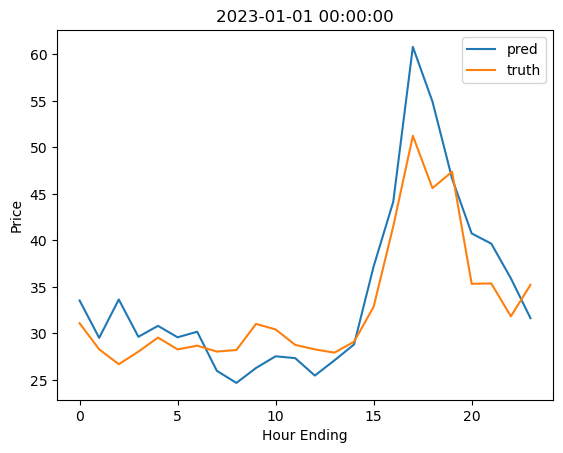

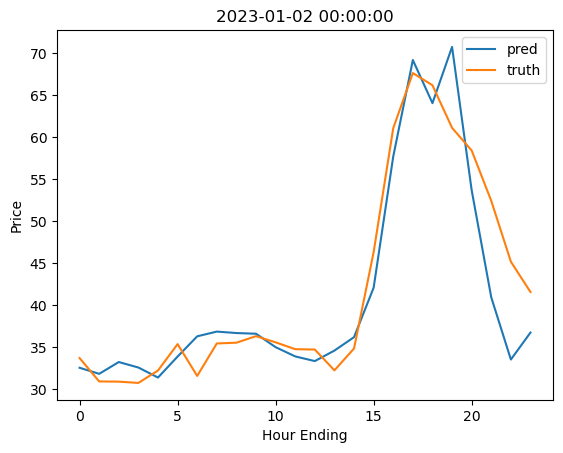

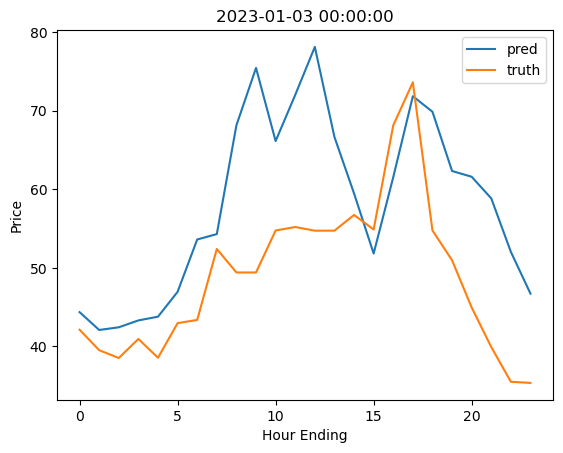

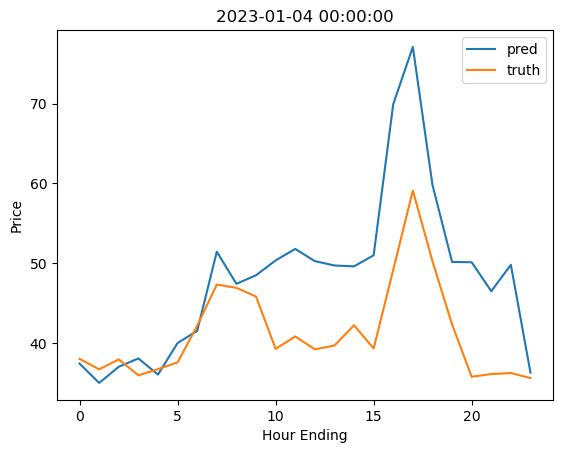

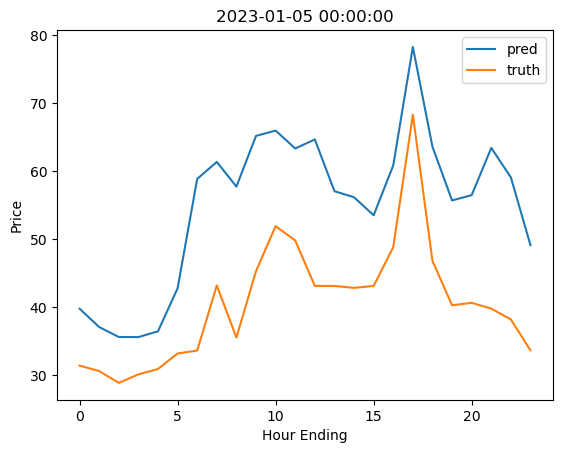

...

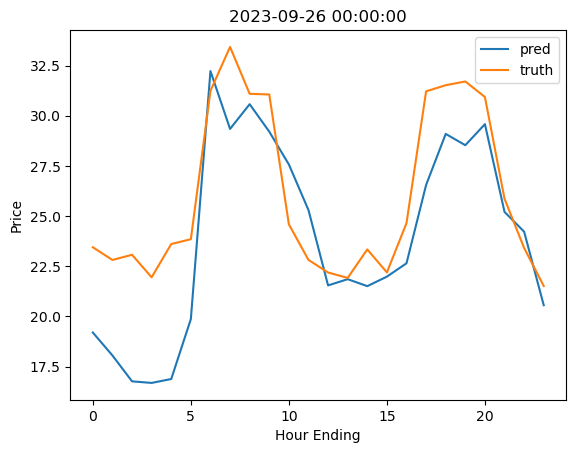

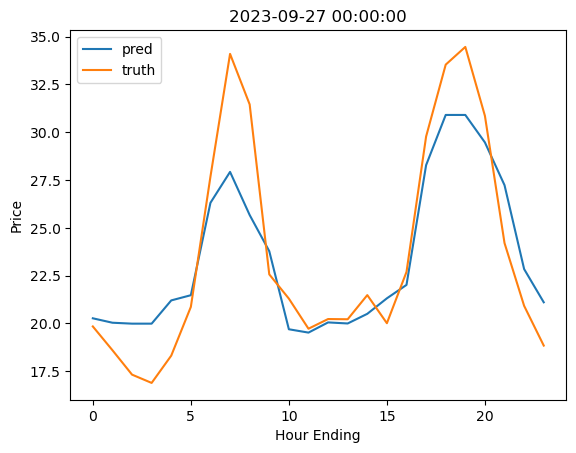

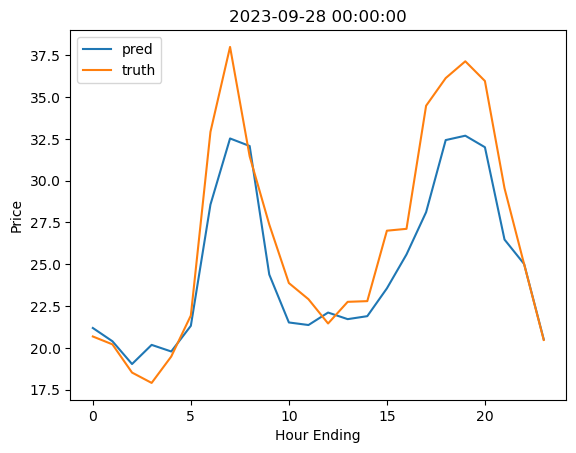

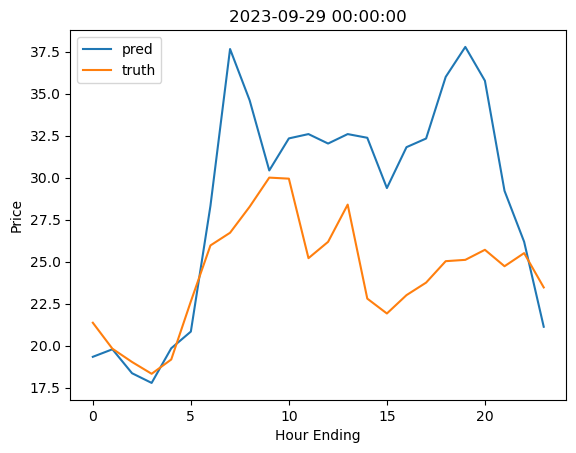

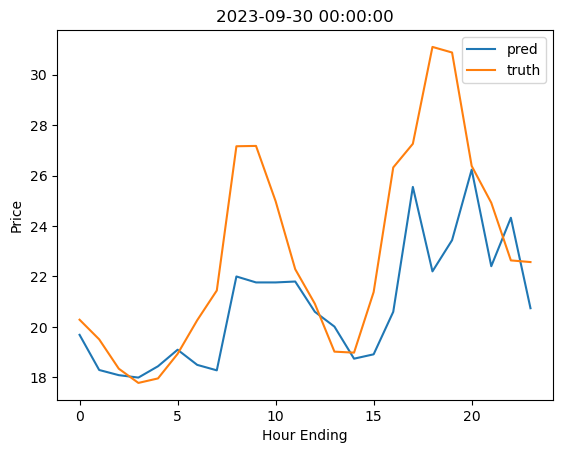

In [26]:
df_pred = pd.read_csv('xgb_pred.csv')
df_pred['Date'] = pd.to_datetime(df_pred['Date'])
x_label = []
mae_list = []
smape_list = []
for _ in range(len(df_pred)):
    if pd.to_datetime('2023/1/1') <= df_pred['Date'][_] <= pd.to_datetime('2023/9/30'):

        pred_by_lstm = np.array(list(map(float, df_pred['pred'][_].replace(" ", ",").replace("\n", "").replace("[", "").replace("]", "").replace("array(", "").replace(")", "").replace(",,", ",").replace(",,", ",").replace(",,", ",").replace(",,", ",").replace(",,", ",").replace(",,", ",").strip("[]").strip("\n").strip(",").split(","))))
        truth_price = get_price_data(df_pred['Date'][_])['Locational Marginal Price'].values
        pred_by_lstm[pred_by_lstm < 0] = 0
        plt.plot(pred_by_lstm, label='pred')
        plt.plot(truth_price, label='truth')
        plt.title(df_pred['Date'][_])
        # plt.ylim(0, 450)
        plt.xlabel('Hour Ending')
        plt.ylabel('Price')
        plt.legend()
        plt.show()
        mse, rmse, mae, smape = loss(truth_price, pred_by_lstm)
        mae_list.append(mae)
        smape_list.append(smape)
df_loss = pd.DataFrame([x_label, mae_list, smape_list]).T
df_loss.columns = ['Date', 'MAE', 'SMAPE']

In [27]:
pd.DataFrame([df_loss['MAE'].mean(), df_loss['SMAPE'].mean()])

,0
0,10.727461
1,0.232463
